**UNIVERSIDADE DO ESTADO DO RIO DE JANEIRO**

**INSTITUTO DE MATEMÁTICA E ESTATÍSTICA - IME**

**COMPUTAÇÃO GRÁFICA (IME 04-10842)**

**DESCRIÇÃO:** Trabalho #2

**Dupla:** Arthur Araujo Aguiar e Theo de Quadros Albuquerque 

**1) Importando módulos do Python**

In [1]:
import numpy as np # operações matemáticas e matriciais
from matplotlib import pyplot as plt # visualização dos gráficos e animações
from matplotlib import animation # funções de animação
from matplotlib import rc # para a definição de parâmetros de runtime configuration (rcParams)

In [ ]:
#funcoes auxiliares
def translada_origem(objeto):
    # calcula o centro do objeto
    centro_x, centro_y = centroide(objeto)
    
    mat_trans = np.array([[1, 0, -centro_x],
                        [0, 1, -centro_y],
                        [0, 0, 1]])
    
    objeto_origem = np.matmul(mat_trans, objeto)
    return objeto_origem, (centro_x, centro_y)
    
def destranslada_origem(objeto, centro):
    centro_x, centro_y = centro
    
    mat_trans = np.array([[1, 0, centro_x],
                        [0, 1, centro_y],
                        [0, 0, 1]])
    
    objeto_destransl = np.matmul(mat_trans, objeto)
    return objeto_destransl

def plot_original_e_transf(objeto, objeto_transf, texto_plot):
    # Calcular os limites do gráfico com base nos pontos
    todos_pontos = np.hstack((objeto, objeto_transf))
    min_x, max_x = np.min(todos_pontos[0, :]), np.max(todos_pontos[0, :])
    min_y, max_y = np.min(todos_pontos[1, :]), np.max(todos_pontos[1, :])
    
    # Adicionar uma margem de 20% para melhor visualização
    margem = 0.2 * max(max_x - min_x, max_y - min_y)
    
    #separa os pontos do objeto para o plot
    x_lim_orig = np.append(objeto[0, :], objeto[0, 0])
    y_lim_orig = np.append(objeto[1, :], objeto[1, 0])
    x_lim_transf = np.append(objeto_transf[0, :], objeto_transf[0, 0])
    y_lim_transf = np.append(objeto_transf[1, :], objeto_transf[1, 0])
    
    #criar a figura para plotar
    plt.figure(figsize=(12,6))
    
    #plotar o objeto original
    plt.subplot(1, 2, 1)
    plt.title("Objeto original")
    plt.xlim((min_x - margem, max_x + margem))
    plt.ylim((min_y - margem, max_y + margem))
    plt.axhline(), plt.axvline()
    plt.plot(x_lim_orig, y_lim_orig, "-bo")
    
    #plotar o objeto transformado
    plt.subplot(1, 2, 2)
    plt.title("Objeto transformado: " + texto_plot)
    plt.xlim((min_x - margem, max_x + margem))
    plt.ylim((min_y - margem, max_y + margem))
    plt.axhline(), plt.axvline()
    plt.plot(x_lim_transf, y_lim_transf, "-ro")
    
    plt.show()

def rotaciona(objeto, angulo):
    # calcula o centro do objeto
    centro_x, centro_y = centroide(objeto)
    
    # translada o objeto para a origem
    objeto_origem, _ = translada_origem(objeto)
    
    #matriz de rotação
    mat_rot = np.array([[np.cos(angulo/180*np.pi), -np.sin(angulo/180*np.pi), 0],
                        [np.sin(angulo/180*np.pi), np.cos(angulo/180*np.pi), 0],
                        [0, 0, 1]])
    
    objeto_rot = np.matmul(mat_rot, objeto_origem)
    
    #destranslada o objeto
    objeto_destransl = destranslada_origem(objeto_rot, (centro_x, centro_y))
    
    return objeto_destransl

def escala(objeto, fator):
    # calcula o centro do objeto    
    centro_x, centro_y = centroide(objeto)

    # translada o objeto para a origem
    objeto_origem, _ = translada_origem(objeto)
    
    #matriz de escala
    mat_esc = np.array([[fator, 0, 0],
                        [0, fator, 0],
                        [0, 0, 1]])
    
    objeto_esc = np.matmul(mat_esc, objeto_origem)
    
    #destranslada o objeto
    objeto_destransl = destranslada_origem(objeto_esc, (centro_x, centro_y))
    
    return objeto_destransl

def centroide(objeto):
    return np.mean(objeto[0,:]), np.mean(objeto[1,:])

**2) Entrada: objetos e valores iniciais**

In [ ]:
# objeto/pontos originais
# po = np.array([[0,0,1],[4.0,0,1],[4.0,4.0,1],[0,4.0,1]])
#po = np.array([[2.0,3.5,1],[0.7,2.75,1],[0.7,1.25,1],[2.0,0.5,1],[3.3,1.25,1],[3.3,2.75,1]])
#po = np.array([[2.0,3.5,1],[1.4,2.8,1],[0.57,2.46,1],[1.05,1.69,1],[1.12,0.8,1],[2.0,1.0,1],[2.88,0.8,1],[2.95,1.7,1],[3.43,2.46,1],[2.6,2.8,1]])
po = np.array([[4.0,6.0,1],[3.5,4.87,1],[2.27,5.0,1],[3.0,4.0,1],[2.27,3.0,1],[3.5,3.13,1],[4.0,2.0,1],[4.5,3.13,1],[5.73,3.0,1],[5.0,4.0,1],[5.73,5.0,1],[4.5,4.87,1]])
po = np.transpose(po)


# calcula limites dos eixos da figura (figsize_x e figsize_y) e limite da translação
# horizontal (limite_translacao) a partir do tamanho do objeto
figsize_x = np.max(po[0,:])
figsize_y = np.max(po[1,:])

# Calcular os limites de x e y
min_x, max_x = np.min(po[0, :]), np.max(po[0, :])
min_y, max_y = np.min(po[1, :]), np.max(po[1, :])
largura = max_x - min_x
posicao_inicial = (0, 0)
limite_translacao = posicao_inicial[0] + largura/2

#inicializa fatores escala (escala), translação horizontal (translacao_h),
# ângulo de rotação (theta), velocidade de translação (velocidade_translacao)
# e velocidade de rotação (velocidade_rotacao)
escala = 1.0
translacao_h = 0.0
theta = 0.0
velocidade_translacao = 0.1
velocidade_rotacao = 1



In [ ]:
# configurando rcParams
rc('animation', html='jshtml')

# criando a figura
fig = plt.figure(figsize=(figsize_x/2,figsize_y/2))
ax = plt.axes()

# função de animação (executada a cada frame)
def animate(i):
    global po, theta, velocidade_rotacao, velocidade_translacao, \
           escala, translacao_h, limite_translacao, figsize_x, figsize_y

    # monta matrizes das transformações

    # executa transformações

    # limpa figura e reconfigura limites dos eixos
    ax.clear()
    ax.set_xlim(-figsize_x, figsize_x), ax.set_ylim(-figsize_y, figsize_y)

    # plota pontos

    # atualiza fatores escala (escala), translação horizontal (translacao_h)
    # e ângulo de rotação (theta)

# cria animação
anim = animation.FuncAnimation(fig, animate, frames=120)

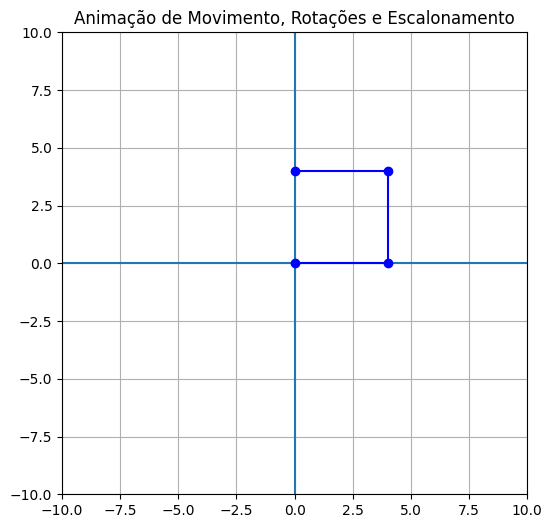

In [24]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

# configurando rcParams
rc('animation', html='jshtml')

# Definindo o objeto inicial (um quadrado como exemplo)
objeto = np.array([
    [0, 0, 1],
    [4.0, 0, 1],
    [4.0, 4.0, 1],
    [0, 4.0, 1]
])
objeto = np.transpose(objeto)

# Funções de transformação

# Função para transladar o objeto
def translada(objeto, delta_x, delta_y=0):
    mat_trans = np.array([[1, 0, delta_x],
                          [0, 1, delta_y],
                          [0, 0, 1]])
    return np.matmul(mat_trans, objeto)

# Função para escalar o objeto
def escala(objeto, fator):
    mat_escala = np.array([
        [fator, 0, 0],
        [0, fator, 0],
        [0, 0, 1]
    ])
    return np.matmul(mat_escala, objeto)

# Função para rotacionar o objeto
def rotaciona(objeto, angulo):
    theta = np.radians(angulo)
    mat_rot = np.array([
        [np.cos(theta), -np.sin(theta), 0],
        [np.sin(theta), np.cos(theta), 0],
        [0, 0, 1]
    ])
    return np.matmul(mat_rot, objeto)

# Função que cria a animação
def animacao(i, objeto, linha_objeto, escala_max=1.0, escala_min=0.5, velocidade_translacao=0.1, velocidade_rotacao=5):
    # Inicializa a translação e a escala para cada fase do movimento
    fase = (i // 100) % 4  # Cada fase dura 100 frames

    # Calculando limites da translação e inicializando as variáveis
    largura_objeto = max(objeto[0, :]) - min(objeto[0, :])
    limite_translacao = largura_objeto * 2  # Limite da translação horizontal

    if fase == 0:  # Move para a direita
        delta_x = i * velocidade_translacao
        fator_escala = 1 - (i % 100) / 200  # Diminui de tamanho até a metade
    elif fase == 1:  # Move para a origem
        delta_x = (i % 100) * velocidade_translacao
        fator_escala = (i % 100) / 200 + 0.5  # Aumenta de tamanho até o tamanho original
    elif fase == 2:  # Move para a esquerda
        delta_x = - (i * velocidade_translacao)
        fator_escala = 1 - (i % 100) / 200  # Diminui de tamanho até a metade
    else:  # Move para a origem
        delta_x = - (i % 100) * velocidade_translacao
        fator_escala = (i % 100) / 200 + 0.5  # Aumenta de tamanho até o tamanho original

    # Translação para a origem (centraliza o objeto)
    objeto_transl = translada(objeto, -objeto[0, 0], -objeto[1, 0])

    # Escalonamento e rotação
    objeto_escala = escala(objeto_transl, fator_escala)
    objeto_rot = rotaciona(objeto_escala, i * velocidade_rotacao)

    # Translação de volta para a posição original (ou ajustada)
    objeto_final = translada(objeto_rot, delta_x)

    # Atualiza a linha do gráfico com o novo objeto transformado
    linha_objeto.set_data(objeto_final[0, :], objeto_final[1, :])

    return linha_objeto,

# Plotando a animação
fig, ax = plt.subplots(figsize=(6, 6))
ax.set_xlim(-10, 10)
ax.set_ylim(-10, 10)
ax.axhline(), ax.axvline()

# Adicionando o objeto inicial
linha_objeto, = ax.plot([], [], 'bo-', label='Objeto')

# Criando a animação
ani = FuncAnimation(fig, animacao, frames=400, fargs=(objeto, linha_objeto), interval=50, blit=True)

plt.title('Animação de Movimento, Rotações e Escalonamento')
plt.grid(True)
plt.show()


In [25]:
ani

**3) Definição da função de animação**

In [ ]:
# configurando rcParams
rc('animation', html='jshtml')

# criando a figura
fig = plt.figure(figsize=(figsize_x/2,figsize_y/2))
ax = plt.axes()

# função de animação (executada a cada frame)
def animate(i):
    global po, theta, velocidade_rotacao, velocidade_translacao, \
           escala, translacao_h, limite_translacao, figsize_x, figsize_y

    # monta matrizes das transformações

    # executa transformações

    # limpa figura e reconfigura limites dos eixos
    ax.clear()
    ax.set_xlim(-figsize_x, figsize_x), ax.set_ylim(-figsize_y, figsize_y)

    # plota pontos

    # atualiza fatores escala (escala), translação horizontal (translacao_h)
    # e ângulo de rotação (theta)

# cria animação
anim = animation.FuncAnimation(fig, animate, frames=120)

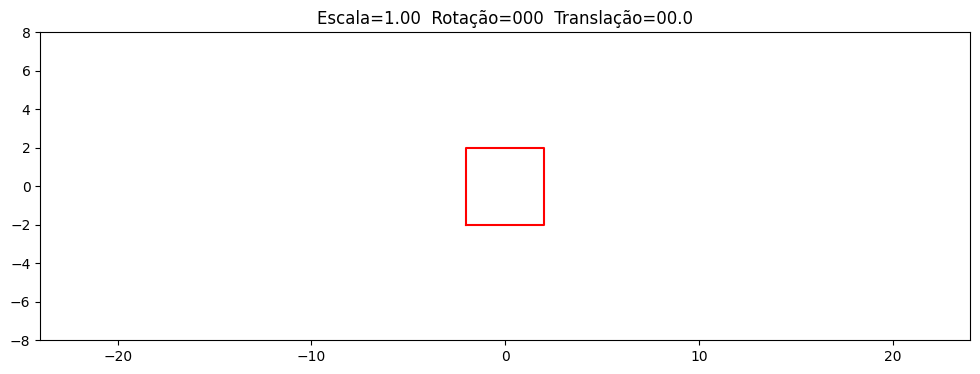

In [ ]:
# configurando rcParams
rc('animation', html='jshtml')

# criando a figura
fig = plt.figure(figsize=(figsize_x/2,figsize_y/2))
ax = plt.axes()

# função de animação (executada a cada frame)
def animate(i):
    global po, theta, velocidade_rotacao, velocidade_translacao, \
           escala, translacao_h, limite_translacao, figsize_x, figsize_y

    # monta matrizes das transformações

    # executa transformações

    # limpa figura e reconfigura limites dos eixos
    ax.clear()
    ax.set_xlim(-figsize_x, figsize_x), ax.set_ylim(-figsize_y, figsize_y)

    # plota pontos

    # atualiza fatores escala (escala), translação horizontal (translacao_h)
    # e ângulo de rotação (theta)

# cria animação
anim = animation.FuncAnimation(fig, animate, frames=120)

**4) Criação e execução da animação**

In [ ]:
# Cria/executa animação
anim